In [2]:
# Directories
import os
os.chdir(r"E:\academy\OneDrive - IIT Delhi\3. IIT DELHI\2. Research\JRF\1_PAPER\2_Analysis")
print(os.getcwd())


E:\academy\OneDrive - IIT Delhi\3. IIT DELHI\2. Academics\1_PAPER\2_Analysis


In [3]:
#Array packages
import cartopy.crs as ccrs
import pandas as pd
import numpy as np
import xarray as xr
import netCDF4 as nc4

from scipy.stats import kendalltau
import pymannkendall as mk

#plots
import matplotlib.pyplot as plt
import rioxarray as rio
import geopandas as gpd
from shapely.geometry import mapping
import matplotlib.ticker as ticker
from matplotlib.ticker import MultipleLocator

#Progress meter
from dask.diagnostics import ProgressBar
from tqdm import tqdm

# Directories
import os
import glob
import dask
#import h5netcdf
import scipy


C:\Users\sstar\anaconda3\envs\imed\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


## 1_FULL TIMESERIES SPI

In [34]:
ds[var[vr]]

<xarray.DataArray 'SPI_RE_cleaned' (region: 18, time: 504)> Size: 73kB
dask.array<open_dataset-SPI_RE_cleaned, shape=(18, 504), dtype=float64, chunksize=(18, 504), chunktype=numpy.ndarray>
Coordinates:
  * time         (time) datetime64[ns] 4kB 1980-01-31 1980-02-29 ... 2021-12-31
    spatial_ref  int32 4B ...
  * region       (region) <U12 864B 'Indus' 'Ganga' ... 'EFMP' 'West Flowing'

C:\Users\sstar\AppData\Local\Temp\ipykernel_14176\1141131400.py:19: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df["slope"][i]=slope
C:\Users\sstar\AppData\Local\Temp\ipykernel_14176\1141131400.py:19: SettingWithCopyWarning: 
A value is tr

NameError: name 'ssn' is not defined

Locator attempting to generate 2020 ticks ([1.0, ..., 2020.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2020 ticks ([1.0, ..., 2020.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2020 ticks ([1.0, ..., 2020.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2020 ticks ([1.0, ..., 2020.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2020 ticks ([1.0, ..., 2020.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2020 ticks ([1.0, ..., 2020.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2020 ticks ([1.0, ..., 2020.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2020 ticks ([1.0, ..., 2020.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2020 ticks ([1.0, ..., 2020.0]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 2020 ticks ([1.0, ..., 2020.0]), which exc

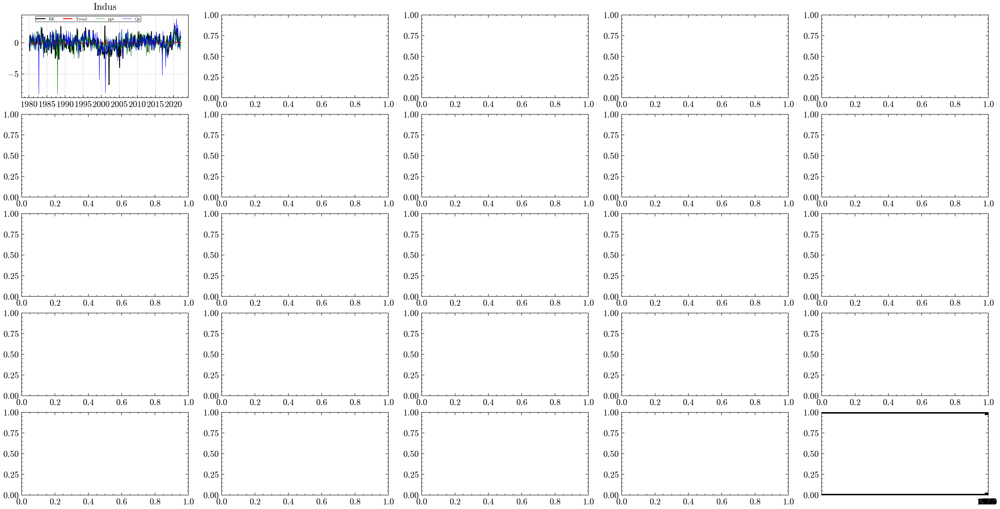

In [6]:
import pymannkendall as mk
from sklearn.linear_model import LinearRegression
mdl=5
vr=4

model=["LIS_MERRA2","LIS_IMD","LIS_CHIRPS","LIS_ERA5","LIS_IMDc","LIS_IMDcnew"]
var=['TotalPrecip_tavg','Evap_tavg','Qs_tavg','RE','RE_cleaned']
#var=[f'SPI_{i}' for i in var]
var1=['PPT','ET','Qs','RE','RE_cleaned']

ds = xr.open_mfdataset(f'DATA_p/LIS/{model[mdl]}/{model[mdl]}_reg_SPI1.nc',engine='netcdf4', parallel=True,chunks={'time': 'auto'})
basin=ds.region.values

result=[]
df = pd.DataFrame({"Basin" : basin, "slope": 0, "p_value": 0})
for i in range(0,len(basin)):
    
    trend, h, p, z, Tau, s, var_s, slope, intercept = mk.original_test(ds[var[vr]].sel(region=basin[i]))
    df["slope"][i]=slope
    df["p_value"][i]=p


    model1=LinearRegression().fit(np.arange(0,504).reshape(-1, 1) , ds[var[vr]].sel(region=basin[i]).values)
    y_pred = model1.predict(np.arange(0,504).reshape(-1, 1))
    result.append(y_pred)

df["sign"] = np.where(df["p_value"] < 0.05, "Trend", "No Trend")
df["colour"] = np.where(df["p_value"] < 0.05, np.where(df["slope"] < 0,"lightyellow", "lightgreen"),"white")
reg_line=xr.DataArray(np.array(result).T, dims=('time', 'region')) 
ds1 = xr.merge([ds, reg_line.rename("reg_line")])



fig, ax = plt.subplots(5,5,figsize=(20,10), facecolor='white', dpi=300)
ax=ax.flatten()

for i in range(25):
        
    import scienceplots
    plt.style.use(['science','no-latex','bright'])
    
    yr=ds1.time
    re=ds1[var[vr]].isel(region=i)
    re_s=ds1['reg_line'].isel(region=i)
   
    ppt=ds1['TotalPrecip_tavg'].isel(region=i)
    qs=ds1['Qs_tavg'].isel(region=i)
    lw=1;al=1
    
    ax[i].plot(yr, re, color='Black', label='RE', alpha=al, linewidth=lw)
    ax[i].plot(yr, re_s, color='red', label='Trend', alpha=al, linewidth=lw)
    
    ax[i].plot(yr, ppt, color='green', label='ppt', alpha=al, linewidth=0.4)
    ax[i].plot(yr, qs, color='blue', label='Qs', alpha=al, linewidth=0.4)
    
    plt.xticks(np.arange(1980, 2020+1, 5.0))
    ax[i].grid(True, color= 'grey', alpha=0.7, linestyle='dotted')
    ax[i].set_facecolor(df['colour'][i])  

    #ax.spines['top'].set_visible(False)
    #ax.spines['right'].set_visible(False)
    ax[i].xaxis.set_tick_params(which='both', bottom=True, top=False)
    ax[i].yaxis.set_tick_params(which='both', left=True, right=False)
    
    
    #ax[i].text(0.5, 0.97,f"Slope : {df['slope'][i].round(3)} ({df['sign'][i]})", fontsize=10, color='red',
      #   ha='left', va='top', transform=ax[i].transAxes)
    
    #ax[i].set_xlabel('$\mathbf{Year}$', fontsize=14)
    #ax[i].set_ylabel('RE', fontsize=14,labelpad=8, weight='bold')
    ax[i].set_title(f'{basin[i]}', fontsize=11)
    
    lgnd=ax[i].legend(loc='center', ncol=4,fontsize=5, bbox_to_anchor=(0.4, 0.95),frameon=True, borderpad=0.2, edgecolor='black')
    frame = lgnd.get_frame()
    frame.set_linewidth(0.5)
    fig.suptitle(f'{model[mdl]}', fontsize=14,fontweight='bold')

plt.tight_layout()
plt.savefig(f'3_RE_trnd/outputs/region/0_full/{model[mdl]}_{var[vr]}.png')
plt.show()

## 2_SeasonalSPI

C:\Users\sstar\AppData\Local\Temp\ipykernel_9184\1032207438.py:31: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_re["slope"][i]=slope
C:\Users\sstar\AppData\Local\Temp\ipykernel_9184\1032207438.py:31: SettingWithCopyWarning: 
A value is t

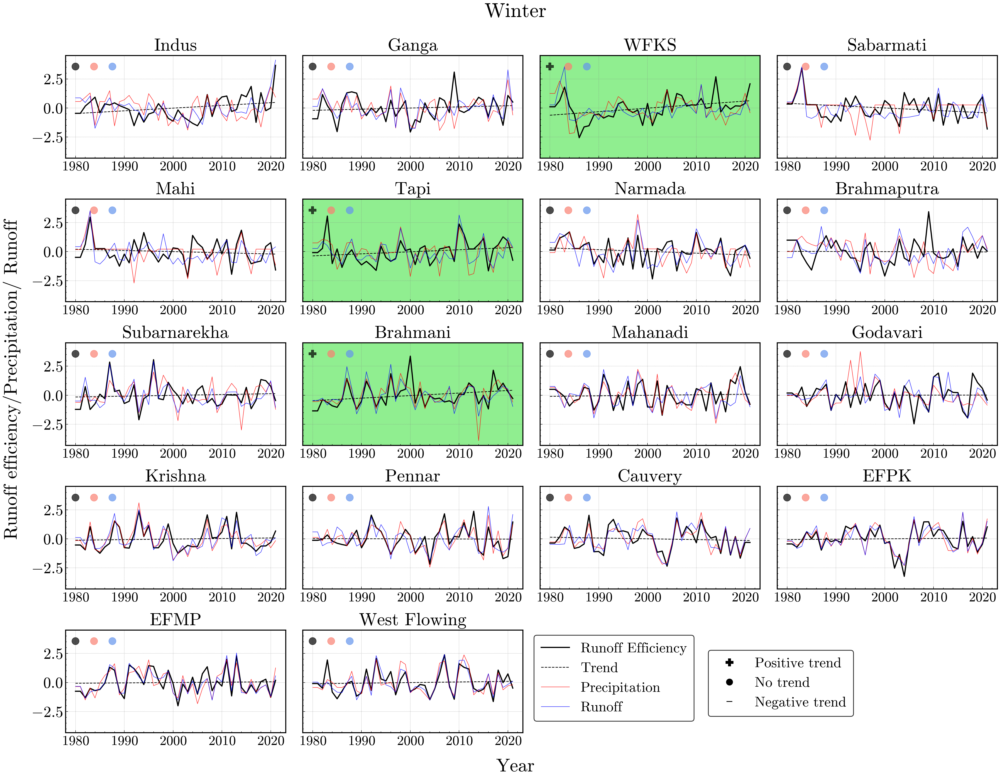

In [7]:
import pymannkendall as mk
from sklearn.linear_model import LinearRegression
from matplotlib.lines import Line2D
import scienceplots
plt.style.use(['science','no-latex','bright'])

mdl=5
ss=3
model=["LIS_MERRA2","LIS_IMD","LIS_CHIRPS","LIS_ERA5","LIS_IMDc","LIS_IMDcnew"]
var=['TotalPrecip_tavg','Evap_tavg','Qs_tavg','RE','RE_cleaned']
ssn=['Pre-monsoon','Monsoon','Post-monsoon','Winter']
ssn_m=[[3,4,5],[6,7,8,9],[10,11],[12,1,2]]

ds_RM = xr.open_mfdataset(f'DATA_p/LIS/{model[mdl]}/{model[mdl]}_reg_ssn_SPI1.nc',engine='netcdf4', parallel=True,chunks={'time': 'auto'})
basin=ds_RM.region.values


var=['TotalPrecip_tavg','Evap_tavg','Qs_tavg','RE','RE_cleaned']
#var=[f'SPI_{i}' for i in var]
vr=4
df_re = pd.DataFrame({"Basin" : basin, "slope": 0, "p_value": 0})
df_q = pd.DataFrame({"Basin" : basin, "slope": 0, "p_value": 0})
df_ppt = pd.DataFrame({"Basin" : basin, "slope": 0, "p_value": 0})

result=[]
ds_RM1=ds_RM.isel(season=ss)
for i in range(0,len(basin)):
    
    
    trend, h, p, z, Tau, s, var_s, slope, intercept = mk.original_test(ds_RM1['RE_cleaned'].sel(region=basin[i]))
    df_re["slope"][i]=slope
    df_re["p_value"][i]=p

    trend, h, p, z, Tau, s, var_s, slope, intercept = mk.original_test(ds_RM1['TotalPrecip_tavg'].sel(region=basin[i]))
    df_ppt["slope"][i]=slope
    df_ppt["p_value"][i]=p

    trend, h, p, z, Tau, s, var_s, slope, intercept = mk.original_test(ds_RM1['TotalPrecip_tavg'].sel(region=basin[i]))
    df_q["slope"][i]=slope
    df_q["p_value"][i]=p

    

    model1=LinearRegression().fit(ds_RM1.year.values.reshape(-1, 1) , ds_RM1['RE_cleaned'].sel(region=basin[i]).values)
    y_pred = model1.predict(ds_RM1.year.values.reshape(-1, 1))
    result.append(y_pred)

reg_line=xr.DataArray(np.array(result).T, dims=('year', 'region')) 
ds_RM1 = xr.merge([ds_RM1, reg_line.rename("reg_line")])


df_re["colour"] = np.where(df_re["p_value"] < 0.05, np.where(df_re["slope"] < 0,"lightyellow", "lightgreen"),"white")
df_re["shape"] = np.where(df_re["p_value"] < 0.05, np.where(df_re["slope"] < 0,"_", "P"),"o")


df_q["shape"] = np.where(df_q["p_value"] < 0.05, np.where(df_q["slope"] < 0,"_", "P"),"o")
df_ppt["shape"] = np.where(df_ppt["p_value"] < 0.05, np.where(df_ppt["slope"] < 0,"_", "P"),"o")


fig, ax = plt.subplots(5,4,figsize=(17,13), facecolor='white', dpi=300,sharey=True)
ax=ax.flatten()


for i in range(18):
        
    import scienceplots
    plt.style.use(['science','no-latex','bright'])
    
    yr=ds_RM1.year
    re=ds_RM1[var[vr]].isel(region=i)
    re_s=ds_RM1['reg_line'].isel(region=i)
   
    ppt=ds_RM1['TotalPrecip_tavg'].isel(region=i)
    qs=ds_RM1['Qs_tavg'].isel(region=i)
    lw=1.2;al=1
    
    ax[i].plot(yr, re, color='black', label='Runoff Efficiency', alpha=al, linewidth=lw*1.2)
    ax[i].plot(yr, re_s, color='black', label='Trend', alpha=al, linewidth=lw*0.7,linestyle='--')
    
    ax[i].plot(yr, ppt, color='red', label='Precipitation', alpha=0.8, linewidth=0.6)
    ax[i].plot(yr, qs, color='blue', label='Runoff', alpha=0.8, linewidth=0.6)


    [x.set_linewidth(1.25) for x in ax[i].spines.values()]
    ax[i].grid(True, color= 'grey', alpha=0.4, linestyle='dotted')
    
    plt.xticks(np.arange(1980, 2020+1, 5.0))
    ax[i].grid(True, color= 'grey', alpha=0.7, linestyle='dotted')
    ax[i].set_facecolor(df_re['colour'][i])  


    ax[i].xaxis.set_tick_params(which='both', bottom=True, top=False,labelsize=17)
    ax[i].yaxis.set_tick_params(which='both', left=True, right=False,labelsize=19.2)
    
    
    #ax[i].text(0.5, 0.97,f"Slope : {df_re['slope'][i].round(3)} ({df['sign'][i]})", fontsize=10, color='red',
     #   ha='left', va='top', transform=ax[i].transAxes)

    # Define custom markers
    markers = [Line2D([0], [0], marker=df_re['shape'][i], color='black', markersize=9, linestyle='None',markeredgewidth=0.5,alpha=0.7),
           Line2D([0], [0], marker=df_ppt['shape'][i], color='salmon', markersize=9, linestyle='None',markeredgewidth=0.5,alpha=0.7),
           Line2D([0], [0], marker=df_ppt['shape'][i], color='cornflowerblue', markersize=9, linestyle='None',markeredgewidth=0.5,alpha=0.7)]

    # Create legend
    ax[i].legend(markers, ['', '', ''],ncol=3,  loc='upper left',bbox_to_anchor=(0.01,0.99),handlelength=0.1, handletextpad=0.2,frameon= False)

    
   # ax[i].annotate(df_re['shape'][i], xy=(0.95, 0.05), xycoords='axes fraction', fontsize=20, color='red', ha='center', va='center', fillstyle='full')
    
    ax[i].set_title(f'{basin[i]}', fontsize=22) 
    fig.suptitle(f'{model[mdl]} ({ssn[ss]})', fontsize=17,fontweight='bold')

# Common xlabel and ylab
fig.text(0.5, -0.02, 'Year', ha='center', fontsize=23,fontweight='bold')
fig.text(-0.02, 0.5, 'Runoff efficiency/Precipitation/ Runoff', va='center', rotation='vertical', fontsize=23, fontweight='bold')
fig.suptitle(f'{ssn[ss]}', fontsize=25,fontweight='bold',y=1)

# Create a common legend
handles, labels = ax[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=1, fontsize=17.5, bbox_to_anchor=(0.6, 0.17), frameon=True, borderpad=0.5, edgecolor='black')


mar_leg = [Line2D([0], [0], marker='P', color='black', markersize=9, linestyle='None',markeredgewidth=0.7),
           Line2D([0], [0], marker='o', color='black', markersize=7, linestyle='None',markeredgewidth=1.5),
           Line2D([0], [0], marker='_', color='black', markersize=7, linestyle='None',markeredgewidth=1)]
fig.legend(mar_leg, ['Positive trend','No trend','Negative trend'], ncol=1, fontsize=17.5, bbox_to_anchor=(0.85, 0.15),frameon=True, borderpad=0.5, edgecolor='black')



[ax[i].axis('off') for i in range(18, 20)]
plt.tight_layout()
plt.savefig(f'3_RE_trnd/outputs/region/2_ssn_SPI/{model[mdl]}_{ssn[ss]}_{var[vr]}.png',dpi=600)
plt.show()

## 2_Seasonal

C:\Users\sstar\AppData\Local\Temp\ipykernel_18584\2759920693.py:29: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df["slope"][i]=slope
C:\Users\sstar\AppData\Local\Temp\ipykernel_18584\2759920693.py:29: SettingWithCopyWarning: 
A value is tr

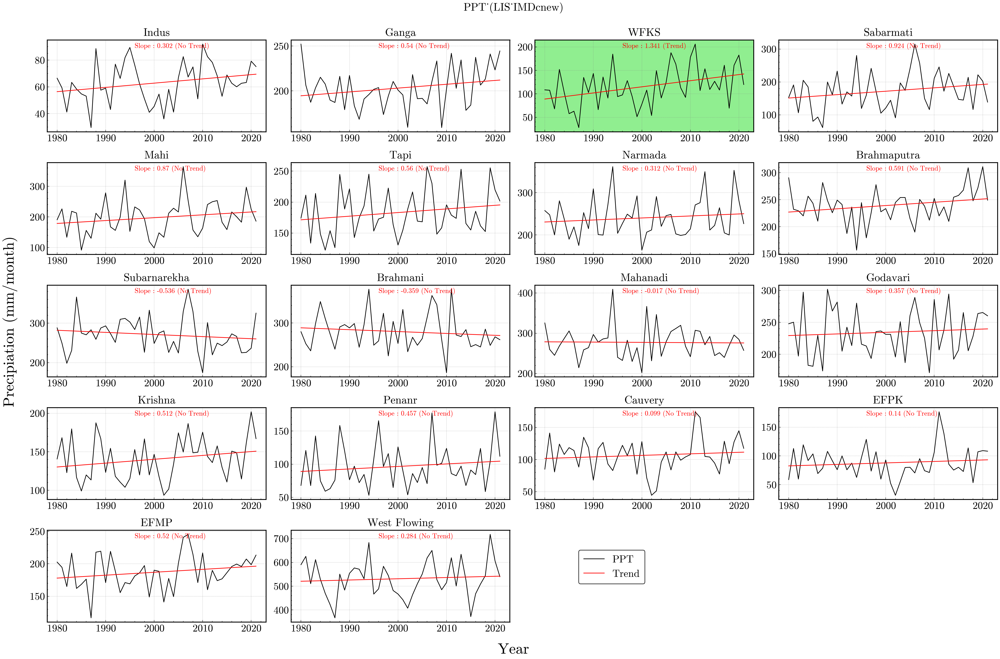

C:\Users\sstar\AppData\Local\Temp\ipykernel_18584\2759920693.py:29: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df["slope"][i]=slope
C:\Users\sstar\AppData\Local\Temp\ipykernel_18584\2759920693.py:29: SettingWithCopyWarning: 
A value is tr

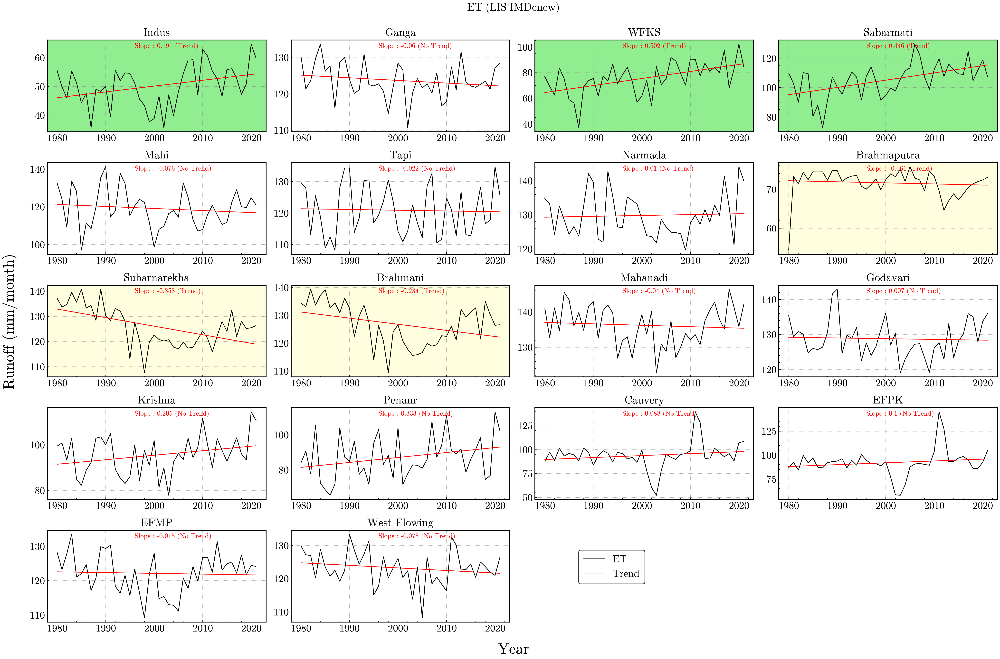

C:\Users\sstar\AppData\Local\Temp\ipykernel_18584\2759920693.py:29: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df["slope"][i]=slope
C:\Users\sstar\AppData\Local\Temp\ipykernel_18584\2759920693.py:29: SettingWithCopyWarning: 
A value is tr

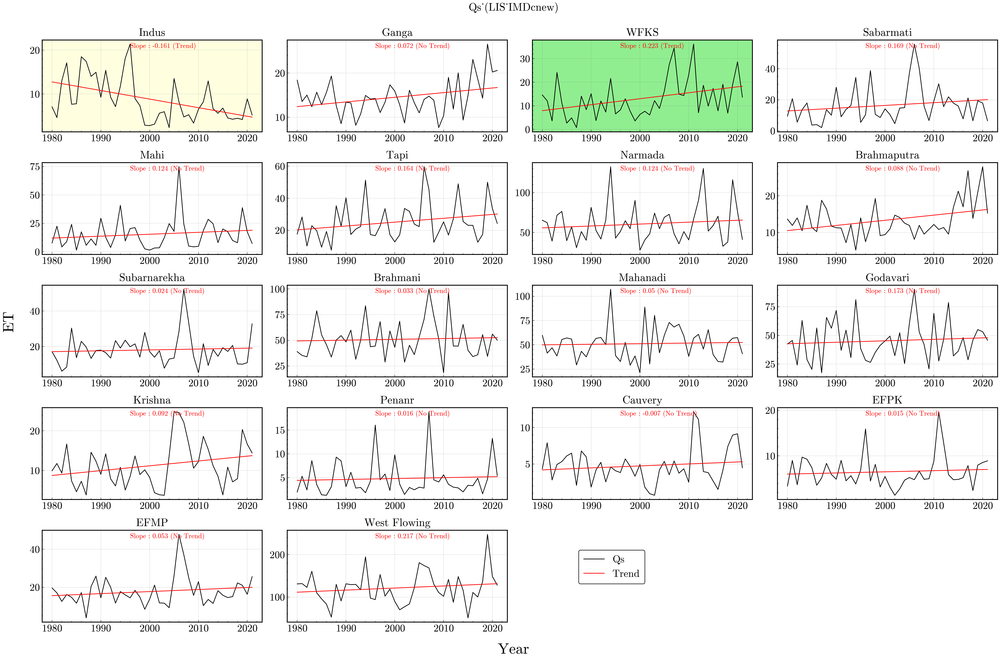

C:\Users\sstar\AppData\Local\Temp\ipykernel_18584\2759920693.py:29: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df["slope"][i]=slope
C:\Users\sstar\AppData\Local\Temp\ipykernel_18584\2759920693.py:29: SettingWithCopyWarning: 
A value is tr

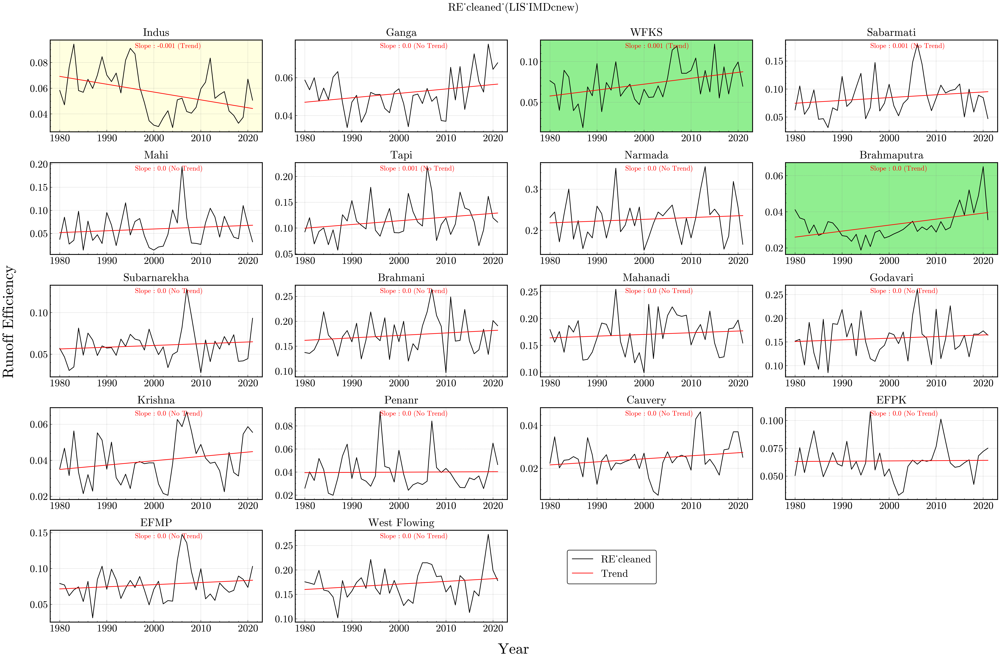

In [21]:
import pymannkendall as mk
from sklearn.linear_model import LinearRegression

mdl=5
ss=1

model=["LIS_MERRA2","LIS_IMD","LIS_CHIRPS","LIS_ERA5","LIS_IMDc","LIS_IMDcnew"]
var=['TotalPrecip_tavg','Evap_tavg','Qs_tavg','RE','RE_cleaned']
var1=['PPT','ET','Qs','RE','RE_cleaned']
ssn=['Pre-monsoon','Monsoon','Post-monsoon','Winter']
ssn_m=[[3,4,5],[6,7,8,9],[10,11],[12,1,2]]

ds_RM = xr.open_mfdataset(f'DATA_p/LIS/{model[mdl]}/{model[mdl]}_reg_ssn.nc',engine='netcdf4', parallel=True,chunks={'time': 'auto'})
basin=ds_RM.region.values
ds_RM


for vr in [0,1,2,4]:

    df = pd.DataFrame({"Basin" : basin, "slope": 0, "p_value": 0})
    result=[]

    for i in range(0,len(basin)):
        
        ds_RM1=ds_RM.isel(season=ss)
        ds_RM1=ds_RM1.where(~ds_RM1.isnull(),0)
 
        trend, h, p, z, Tau, s, var_s, slope, intercept = mk.original_test(ds_RM1[var[vr]].sel(region=basin[i]))
        df["slope"][i]=slope
        df["p_value"][i]=p
    
    
        model1=LinearRegression().fit(ds_RM1.year.values.reshape(-1, 1) , ds_RM1[var[vr]].sel(region=basin[i]).values)
        y_pred = model1.predict(ds_RM1.year.values.reshape(-1, 1))
        result.append(y_pred)
    
    df["sign"] = np.where(df["p_value"] < 0.05, "Trend", "No Trend")
    df["colour"] = np.where(df["p_value"] < 0.05, np.where(df["slope"] < 0,"lightyellow", "lightgreen"),"white")
    reg_line=xr.DataArray(np.array(result).T, dims=('year', 'region')) 
    ds_RM1 = xr.merge([ds_RM1, reg_line.rename("reg_line")])
    
    
    
    fig, ax = plt.subplots(5,4,figsize=(20,13), facecolor='white', dpi=300)
    ax=ax.flatten()
   
    for i in range(18):
            
        import scienceplots
        plt.style.use(['science','no-latex','bright'])
        
        yr=ds_RM1.year
        re=ds_RM1[var[vr]].isel(region=i)
        re_s=ds_RM1['reg_line'].isel(region=i)
       
        [x.set_linewidth(1.25) for x in ax[i].spines.values()]
        ax[i].grid(True, color= 'grey', alpha=0.4, linestyle='dotted')

        
        lw=1;al=1
        
        ax[i].plot(yr, re, color='Black', label=var1[vr], alpha=al, linewidth=lw)
        ax[i].plot(yr, re_s, color='red', label='Trend', alpha=al, linewidth=lw)
        
        
        plt.xticks(np.arange(1980, 2020+1, 5.0))
        ax[i].grid(True, color= 'grey', alpha=0.7, linestyle='dotted')
        ax[i].set_facecolor(df['colour'][i])  
    
        #ax.spines['top'].set_visible(False)
        #ax.spines['right'].set_visible(False)
        ax[i].xaxis.set_tick_params(which='both', bottom=True, top=False,labelsize=15)
        ax[i].yaxis.set_tick_params(which='both', left=True, right=False,labelsize=15)
        
        
        ax[i].text(0.4, 0.97,f"Slope : {df['slope'][i].round(3)} ({df['sign'][i]})", fontsize=10, color='red',
             ha='left', va='top', transform=ax[i].transAxes)
        
        #ax[i].set_xlabel('$\mathbf{Year}$', fontsize=14)
        #ax[i].set_ylabel('RE', fontsize=14,labelpad=8, weight='bold')
        ax[i].set_title(f'{basin[i]}', fontsize=16)
        

        fig.suptitle(f'{var1[vr]} ({model[mdl]},{ssn[ss]})', fontsize=14,fontweight='bold')

    
    
    # Common xlabel and ylab
    var_tit=['Precipiation (mm/month)','Runoff (mm/month)','ET','Runoff Efficiency','Runoff Efficiency']
    fig.text(0.5, -0.02, 'Year', ha='center', fontsize=22,fontweight='bold')
    fig.text(-0.02, 0.5, var_tit[vr], va='center', rotation='vertical', fontsize=22, fontweight='bold')
    fig.suptitle(f'{var1[vr]}_({model[mdl]})', fontsize=16,fontweight='bold',y=1)


    # Create a common legend
    handles, labels = ax[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=1, fontsize=15, bbox_to_anchor=(0.6, 0.15), frameon=True, borderpad=0.5, edgecolor='black')
    
    [ax[i].axis('off') for i in range(18, 20)]
    plt.tight_layout()
    plt.savefig(f'3_RE_trnd/outputs/region/1_ssn/{model[mdl]}_{ssn[ss]}_{var1[vr]}.png',dpi=300)
    plt.show()